<a href="https://colab.research.google.com/github/YuvarajGML/YuvarajGML/blob/main/EL_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import zipfile
import os
import shutil


zip_path = "archive.zip"
extract_dir = "extracted"
final_dataset_dir = "dataset"
images_dir = os.path.join(final_dataset_dir, "images")
masks_dir = os.path.join(final_dataset_dir, "masks")


with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)


os.makedirs(images_dir, exist_ok=True)
os.makedirs(masks_dir, exist_ok=True)


for root, dirs, files in os.walk(extract_dir):
    for file in files:
        if file.endswith((".jpg", ".jpeg", ".png")):
            file_path = os.path.join(root, file)
            if "image" in file.lower():
                shutil.move(file_path, os.path.join(images_dir, file))
            elif "mask" in file.lower():
                shutil.move(file_path, os.path.join(masks_dir, file))

print("Dataset unzipped and organized.")


Dataset unzipped and organized.


Epoch [1/15], Loss: 0.3829
Epoch [2/15], Loss: 0.1538
Epoch [3/15], Loss: 0.1312
Epoch [4/15], Loss: 0.1004
Epoch [5/15], Loss: 0.0854
Epoch [6/15], Loss: 0.0752
Epoch [7/15], Loss: 0.0676
Epoch [8/15], Loss: 0.0611
Epoch [9/15], Loss: 0.0554
Epoch [10/15], Loss: 0.0501
Epoch [11/15], Loss: 0.0458
Epoch [12/15], Loss: 0.0421
Epoch [13/15], Loss: 0.0388
Epoch [14/15], Loss: 0.0357
Epoch [15/15], Loss: 0.0330


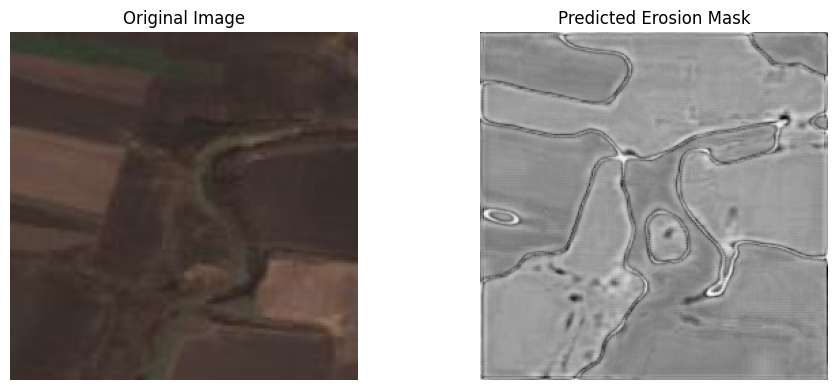

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class SoilErosionDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_paths = sorted([os.path.join(img_dir, f) for f in os.listdir(img_dir) if f.endswith(".jpg")])
        self.mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith(".png")])
        self.transform = transform

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        image = np.array(Image.open(self.img_paths[idx]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[idx]).convert("L"))
        mask = (mask > 0).astype(np.float32)  # Ensure float for BCEWithLogitsLoss

        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"].unsqueeze(0)

        return image, mask


class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )

        self.down1 = conv_block(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.bottom = conv_block(256, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.conv3 = conv_block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, 1, kernel_size=1)

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)
        d2 = self.down2(p1)
        p2 = self.pool2(d2)
        d3 = self.down3(p2)
        p3 = self.pool3(d3)

        b = self.bottom(p3)

        u3 = self.up3(b)
        u3 = torch.cat([u3, d3], dim=1)
        u3 = self.conv3(u3)

        u2 = self.up2(u3)
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.conv2(u2)

        u1 = self.up1(u2)
        u1 = torch.cat([u1, d1], dim=1)
        u1 = self.conv1(u1)

        return self.final(u1)  # No sigmoid


transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(),
    ToTensorV2()
])

train_dataset = SoilErosionDataset(
    img_dir="/content/extracted/processed_data/train",
    mask_dir="/content/extracted/processed_data/masks",
    transform=transform
)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

model = UNet().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 15
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)

        outputs = model(images)
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")

torch.save(model.state_dict(), "unet_weights_final.pth")


def normalize_mask(mask):
    return (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)

def show_prediction(image, mask):
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(normalize_mask(mask), cmap='gray')
    plt.title("Predicted Erosion Mask")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def predict_image_from_local(model, image_path, transform, device):
    model.eval()
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)
    transformed = transform(image=img_np)
    tensor_img = transformed['image'].unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(tensor_img)
        pred = torch.sigmoid(output).squeeze().cpu().numpy()

    return img_np, pred


if __name__ == "__main__":
    image_path = "1020.jpg"
    model = UNet().to(device)
    model.load_state_dict(torch.load("unet_weights_final.pth", map_location=device))

    image, pred_mask = predict_image_from_local(model, image_path, transform, device)
    show_prediction(image, pred_mask)




In [ ]:

!pip install torchsummary

from torchsummary import summary


summary(model, input_size=(3, 256, 256))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7         [-1, 64, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
        MaxPool2d-14          [-1, 128,

/tmp/ipython-input-4-1443078453.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(contributions.keys()), y=list(contributions.values()), palette="magma", ax=ax4)


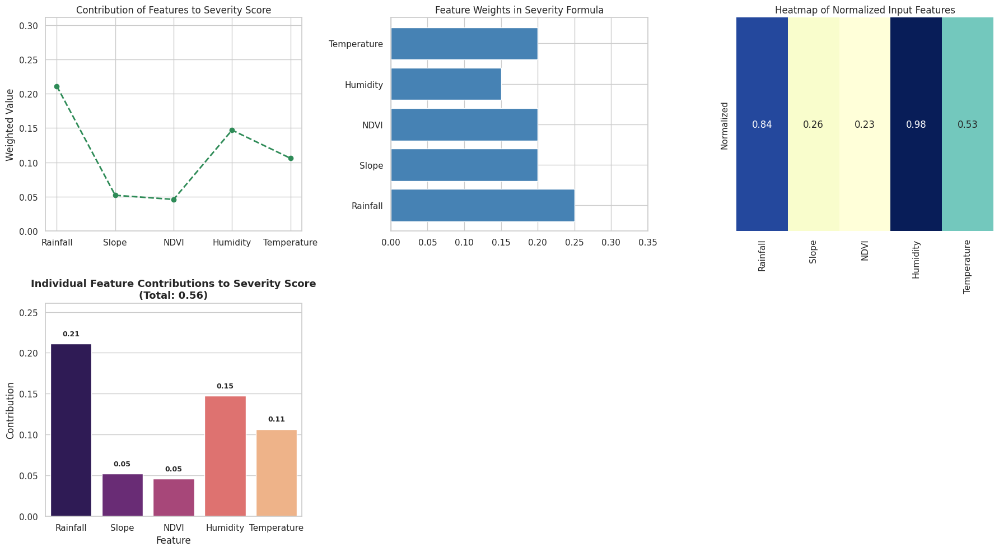

In [ ]:
import random
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


def generate_mock_rainfall(): return round(random.uniform(0, 300), 2)
def generate_mock_slope(): return round(random.uniform(-10, 10), 2)
def generate_mock_ndvi(): return round(random.uniform(-1, 1), 2)
def generate_mock_humidity(): return round(random.uniform(0, 100), 2)
def generate_mock_temperature(): return round(random.uniform(-10, 50), 2)

def normalize_inputs(rainfall, slope, ndvi, humidity, temperature):
    return (
        rainfall / 300,
        abs(slope) / 10,
        (1 - ndvi) / 2,
        humidity / 100,
        (temperature + 10) / 60
    )

def calculate_severity(*normalized):
    weights = [0.25, 0.2, 0.2, 0.15, 0.2]
    severity = sum(w * val for w, val in zip(weights, normalized))
    return round(min(severity, 1), 2), weights


rainfall = generate_mock_rainfall()
slope = generate_mock_slope()
ndvi = generate_mock_ndvi()
humidity = generate_mock_humidity()
temperature = generate_mock_temperature()

norm_rainfall, norm_slope, norm_ndvi, norm_humidity, norm_temp = normalize_inputs(
    rainfall, slope, ndvi, humidity, temperature)

norm_values = [norm_rainfall, norm_slope, norm_ndvi, norm_humidity, norm_temp]
severity, weights = calculate_severity(*norm_values)

features = ['Rainfall', 'Slope', 'NDVI', 'Humidity', 'Temperature']
actuals = [f"{rainfall} mm", f"{slope}°", f"{ndvi}", f"{humidity}%", f"{temperature}°C"]
weighted = [round(w * v, 3) for w, v in zip(weights, norm_values)]

# --- Set Style ---
sns.set(style="whitegrid")
fig = plt.figure(figsize=(18, 10))
gs = fig.add_gridspec(2, 3)

ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(features, weighted, marker='o', color='seagreen', linestyle='--', linewidth=2)
ax1.set_title("Contribution of Features to Severity Score")
ax1.set_ylabel("Weighted Value")
ax1.set_ylim(0, max(weighted) + 0.1)


ax2 = fig.add_subplot(gs[0, 1])
ax2.barh(features, weights, color='steelblue')
ax2.set_title("Feature Weights in Severity Formula")
ax2.set_xlim(0, max(weights) + 0.1)


ax3 = fig.add_subplot(gs[0, 2])
sns.heatmap([norm_values], cmap='YlGnBu', annot=True, cbar=False,
            xticklabels=features, yticklabels=["Normalized"])
ax3.set_title("Heatmap of Normalized Input Features")


contributions = {
    'Rainfall': norm_rainfall * 0.25,
    'Slope': norm_slope * 0.2,
    'NDVI': norm_ndvi * 0.2,
    'Humidity': norm_humidity * 0.15,
    'Temperature': norm_temp * 0.2
}

ax4 = fig.add_subplot(gs[1, 0])
sns.barplot(x=list(contributions.keys()), y=list(contributions.values()), palette="magma", ax=ax4)
ax4.set_title(f"Individual Feature Contributions to Severity Score\n(Total: {severity:.2f})", fontsize=13, weight='bold')
ax4.set_ylabel("Contribution")
ax4.set_xlabel("Feature")
ax4.set_ylim(0, max(contributions.values()) + 0.05)
for i, v in enumerate(contributions.values()):
    ax4.text(i, v + 0.01, f"{v:.2f}", ha='center', fontsize=9, weight='bold')


for pos in [gs[1, 1], gs[1, 2]]:
    ax = fig.add_subplot(pos)
    ax.axis("off")

plt.tight_layout()
plt.show()


/tmp/ipython-input-5-135895988.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar = sns.barplot(x=features, y=values, palette="coolwarm", ax=ax1)


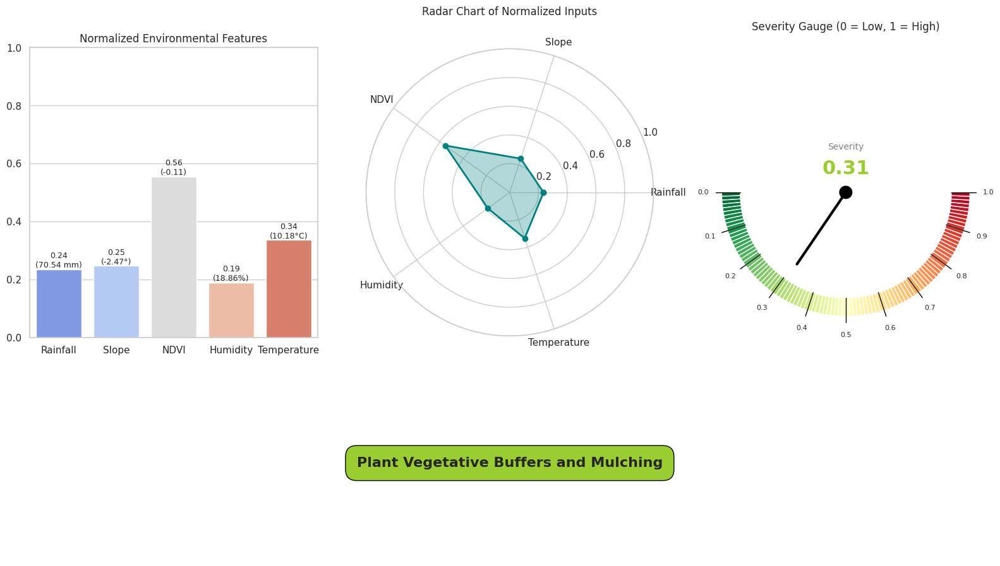

In [ ]:
import random
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Wedge, Circle


def generate_mock_rainfall(): return round(random.uniform(0, 300), 2)
def generate_mock_slope(): return round(random.uniform(-10, 10), 2)
def generate_mock_ndvi(): return round(random.uniform(-1, 1), 2)
def generate_mock_humidity(): return round(random.uniform(0, 100), 2)
def generate_mock_temperature(): return round(random.uniform(-10, 50), 2)


def normalize_inputs(rainfall, slope, ndvi, humidity, temperature):
    return (
        rainfall / 300,
        abs(slope) / 10,
        (1 - ndvi) / 2,
        humidity / 100,
        (temperature + 10) / 60  # -10 to 50 → 0 to 1
    )


def calculate_severity(*normalized):
    weights = [0.25, 0.2, 0.2, 0.15, 0.2]  # Rainfall, Slope, NDVI, Humidity, Temp
    severity = sum(w * val for w, val in zip(weights, normalized))
    return round(min(severity, 1), 2)


def suggest_action_based_on_severity(severity):
    if severity >= 0.9:
        return "Immediate Terracing and Afforestation with Check Dams", "darkred"
    elif severity >= 0.8:
        return "Implement Terracing and Afforestation", "red"
    elif severity >= 0.7:
        return "Contour Bunding and Gully Plugging", "orangered"
    elif severity >= 0.6:
        return "Contour Bunding", "orange"
    elif severity >= 0.5:
        return "Grassed Waterways and Cover Crops", "gold"
    elif severity >= 0.3:
        return "Plant Vegetative Buffers and Mulching", "yellowgreen"
    elif severity >= 0.1:
        return "Regular Monitoring and Soil Conservation Education", "lightgreen"
    else:
        return "Minimal Risk – Maintain Natural Vegetation", "green"


# Generate data
rainfall = generate_mock_rainfall()
slope = generate_mock_slope()
ndvi = generate_mock_ndvi()
humidity = generate_mock_humidity()
temperature = generate_mock_temperature()

norm_rainfall, norm_slope, norm_ndvi, norm_humidity, norm_temp = normalize_inputs(
    rainfall, slope, ndvi, humidity, temperature)
severity = calculate_severity(norm_rainfall, norm_slope, norm_ndvi, norm_humidity, norm_temp)
suggested_action, severity_color = suggest_action_based_on_severity(severity)


sns.set(style="whitegrid")
fig = plt.figure(figsize=(16, 9))
gs = fig.add_gridspec(2, 3, height_ratios=[3, 2])


ax1 = fig.add_subplot(gs[0, 0])
features = ['Rainfall', 'Slope', 'NDVI', 'Humidity', 'Temperature']
values = [norm_rainfall, norm_slope, norm_ndvi, norm_humidity, norm_temp]
actuals = [f"{rainfall} mm", f"{slope}°", f"{ndvi}",
           f"{humidity}%", f"{temperature}°C"]

bar = sns.barplot(x=features, y=values, palette="coolwarm", ax=ax1)
for i, patch in enumerate(bar.patches):
    height = patch.get_height()
    bar.annotate(f"{values[i]:.2f}\n({actuals[i]})",
                 (patch.get_x() + patch.get_width() / 2, height),
                 ha='center', va='bottom', fontsize=9)
ax1.set_ylim(0, 1)
ax1.set_title("Normalized Environmental Features")


ax2 = fig.add_subplot(gs[0, 1], polar=True)
labels = np.array(features)
stats = np.array(values)
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
stats = np.concatenate((stats, [stats[0]]))
angles += angles[:1]

ax2.plot(angles, stats, 'o-', linewidth=2, color="teal")
ax2.fill(angles, stats, alpha=0.3, color="teal")
ax2.set_thetagrids(np.degrees(angles[:-1]), labels)
ax2.set_title("Radar Chart of Normalized Inputs", y=1.1)
ax2.set_ylim(0, 1)


ax3 = fig.add_subplot(gs[0, 2])
ax3.axis("equal")
ax3.axis("off")
ax3.set_xlim(-1.2, 1.2)
ax3.set_ylim(-1.2, 1.2)
num_sections = 100
for i in range(num_sections):
    start = 180 + (i * 180 / num_sections)
    end = 180 + ((i + 1) * 180 / num_sections)
    color = plt.cm.RdYlGn_r(i / num_sections)
    ax3.add_patch(Wedge((0, 0), 1, start, end, width=0.15, facecolor=color))

for i in range(0, 11):
    angle = 180 + i * 18
    x_outer = np.cos(np.radians(angle)) * 1.05
    y_outer = np.sin(np.radians(angle)) * 1.05
    x_inner = np.cos(np.radians(angle)) * 0.85
    y_inner = np.sin(np.radians(angle)) * 0.85
    ax3.plot([x_inner, x_outer], [y_inner, y_outer], color='black', lw=1)
    x_label = np.cos(np.radians(angle)) * 1.15
    y_label = np.sin(np.radians(angle)) * 1.15
    ax3.text(x_label, y_label, f"{i/10:.1f}", ha='center', va='center', fontsize=8)

angle = 180 + severity * 180
x = np.cos(np.radians(angle)) * 0.7
y = np.sin(np.radians(angle)) * 0.7
ax3.plot([0, x], [0, y], color='black', lw=3)
ax3.add_patch(Circle((0, 0), 0.05, color='black'))
ax3.text(0, 0.35, "Severity", ha='center', fontsize=10, color='gray')
ax3.text(0, 0.15, f"{severity:.2f}", ha='center', fontsize=22,
         color=severity_color, fontweight='bold')
ax3.set_title("Severity Gauge (0 = Low, 1 = High)", pad=20)


ax4 = fig.add_subplot(gs[1, :])
ax4.axis("off")
ax4.text(0.5, 0.5, suggested_action,
         ha="center", va="center", fontsize=16, fontweight="bold",
         bbox=dict(boxstyle="round,pad=0.8", facecolor=severity_color, edgecolor="black"))

plt.tight_layout()
plt.show()


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import sklearn.metrics as metrics


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class SoilErosionDataset(Dataset):

    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = transform
        img_files = [f for f in os.listdir(img_dir) if f.endswith(".jpg")]
        mask_files = [f for f in os.listdir(mask_dir) if f.endswith(".png")]

        img_stems = {os.path.splitext(f)[0] for f in img_files}
        mask_stems = {os.path.splitext(f)[0] for f in mask_files}
        common_stems = sorted(img_stems & mask_stems)

        if not common_stems:
            raise ValueError("No matching image-mask pairs found. Check filenames.")

        self.img_paths = [os.path.join(img_dir, stem + ".jpg") for stem in common_stems]
        self.mask_paths = [os.path.join(mask_dir, stem + ".png") for stem in common_stems]

        print(f"Found {len(self.img_paths)} valid image-mask pairs.")

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        if idx >= len(self.img_paths):
            raise IndexError(f"Index {idx} out of range for dataset of size {len(self.img_paths)}")

        image = np.array(Image.open(self.img_paths[idx]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[idx]).convert("L"))
        mask = (mask > 0).astype(np.float32)

        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"].unsqueeze(0)  # Shape: (1, H, W)

        return image, mask



class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )

        self.down1 = conv_block(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.bottom = conv_block(256, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.conv3 = conv_block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, 1, kernel_size=1)

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)
        d2 = self.down2(p1)
        p2 = self.pool2(d2)
        d3 = self.down3(p2)
        p3 = self.pool3(d3)

        b = self.bottom(p3)

        u3 = self.up3(b)
        u3 = torch.cat([u3, d3], dim=1)
        u3 = self.conv3(u3)

        u2 = self.up2(u3)
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.conv2(u2)

        u1 = self.up1(u2)
        u1 = torch.cat([u1, d1], dim=1)
        u1 = self.conv1(u1)

        return self.final(u1)


transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(),
    ToTensorV2()
])

train_dataset = SoilErosionDataset(
    img_dir="/content/extracted/processed_data/train",
    mask_dir="/content/extracted/processed_data/masks",
    transform=transform
)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

model = UNet().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 3
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)

        outputs = model(images)
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")

torch.save(model.state_dict(), "unet_weights_final.pth")


def iou_score(y_true, y_pred, threshold=0.5):
    y_pred = (y_pred > threshold).astype(np.uint8)
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return 1.0 if union == 0 else intersection / union

def dice_coef(y_true, y_pred, threshold=0.5):
    y_pred = (y_pred > threshold).astype(np.uint8)
    intersection = np.logical_and(y_true, y_pred).sum()
    return 2 * intersection / (y_true.sum() + y_pred.sum() + 1e-8)

def precision_score(y_true, y_pred, threshold=0.5):
    y_pred = (y_pred > threshold).astype(np.uint8)
    return metrics.precision_score(y_true.flatten(), y_pred.flatten(), zero_division=1)

def recall_score(y_true, y_pred, threshold=0.5):
    y_pred = (y_pred > threshold).astype(np.uint8)
    return metrics.recall_score(y_true.flatten(), y_pred.flatten(), zero_division=1)

def accuracy_score(y_true, y_pred, threshold=0.5):
    y_pred = (y_pred > threshold).astype(np.uint8)
    return metrics.accuracy_score(y_true.flatten(), y_pred.flatten())


def evaluate_model(model, dataloader, device):
    model.eval()
    iou_list, dice_list, precision_list, recall_list, accuracy_list = [], [], [], [], []

    with torch.no_grad():
        for images, masks in dataloader:
            images = images.to(device)
            masks = masks.numpy().astype(np.uint8)

            outputs = model(images)
            preds = torch.sigmoid(outputs).cpu().numpy()

            for i in range(len(masks)):
                true_mask = masks[i][0]
                pred_mask = preds[i][0] if preds[i].ndim == 3 else preds[i]

                iou_list.append(iou_score(true_mask, pred_mask))
                dice_list.append(dice_coef(true_mask, pred_mask))
                precision_list.append(precision_score(true_mask, pred_mask))
                recall_list.append(recall_score(true_mask, pred_mask))
                accuracy_list.append(accuracy_score(true_mask, pred_mask))

    print(f"Mean IoU: {np.mean(iou_list):.4f}")
    print(f"Mean Dice Coefficient: {np.mean(dice_list):.4f}")
    print(f"Mean Precision: {np.mean(precision_list):.4f}")
    print(f"Mean Recall: {np.mean(recall_list):.4f}")
    print(f"Mean Accuracy: {np.mean(accuracy_list):.4f}")

    return {
        'IoU': iou_list,
        'Dice': dice_list,
        'Precision': precision_list,
        'Recall': recall_list,
        'Accuracy': accuracy_list
    }


if __name__ == "__main__":
    test_dataset = SoilErosionDataset(
        img_dir="/content/extracted/processed_data/train",
        mask_dir="/content/extracted/processed_data/masks",
        transform=transform
    )
    test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

    model = UNet().to(device)
    model.load_state_dict(torch.load("unet_weights_final.pth", map_location=device))

    # Evaluate on test data
    metrics_dict = evaluate_model(model, test_loader, device)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


metric_names = list(metrics_dict.keys())
num_samples = len(next(iter(metrics_dict.values())))

data = {
    "Sample": list(range(num_samples)) * len(metric_names),
    "Metric": sum([[name] * num_samples for name in metric_names], []),
    "Value": sum([metrics_dict[name] for name in metric_names], [])
}

df = pd.DataFrame(data)
sns.set(style="whitegrid", font_scale=1.2)


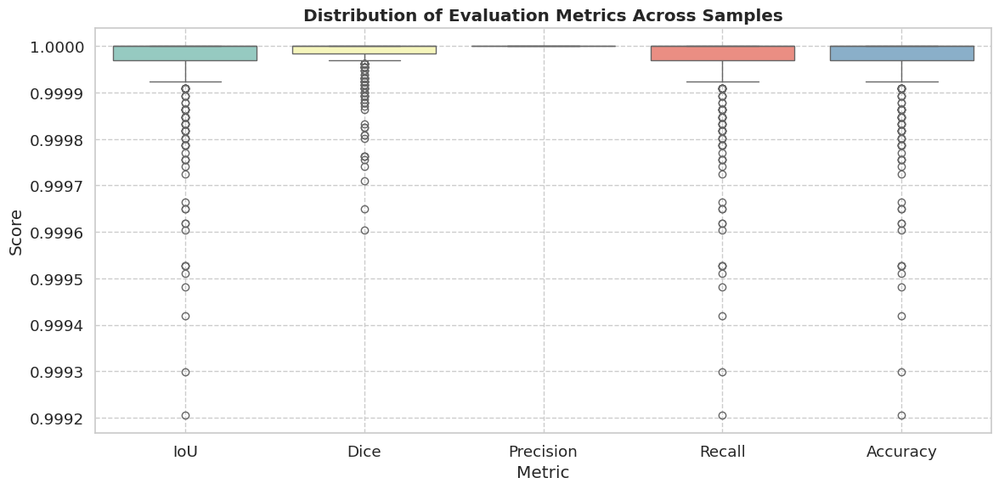

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="Metric", y="Value", data=df, hue='Metric', palette="Set3")
plt.title("Distribution of Evaluation Metrics Across Samples", fontweight='bold')
plt.ylabel("Score")
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.show()

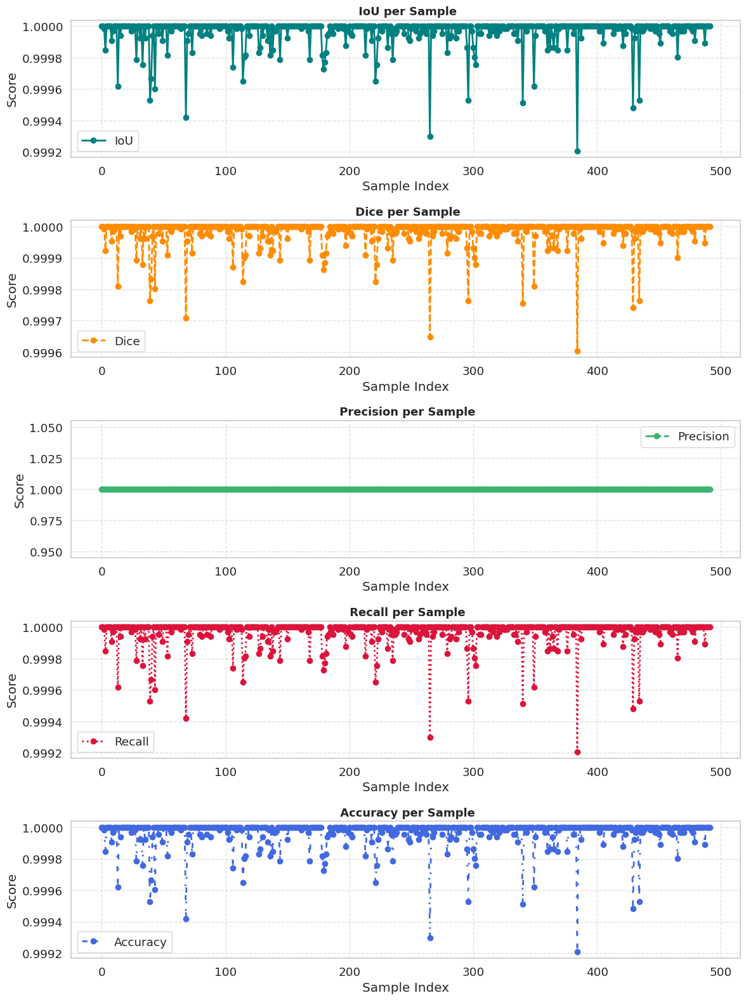

In [ ]:
import matplotlib.pyplot as plt

colors = ['teal', 'darkorange', 'mediumseagreen', 'crimson', 'royalblue']
linestyles = ['-', '--', '-.', ':', (0, (3, 5, 1, 5))]  # Custom dash pattern for variety

fig, axs = plt.subplots(len(metric_names), 1, figsize=(12, 3.2 * len(metric_names)))

for i, metric in enumerate(metric_names):
    axs[i].plot(
        metrics_dict[metric],
        marker='o',
        linestyle=linestyles[i % len(linestyles)],
        color=colors[i % len(colors)],
        label=metric,
        linewidth=2,
        markersize=6
    )
    axs[i].set_title(f" {metric} per Sample", fontweight='bold', fontsize=13)
    axs[i].set_ylabel("Score")
    axs[i].set_xlabel("Sample Index")
    axs[i].legend(loc='best')
    axs[i].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


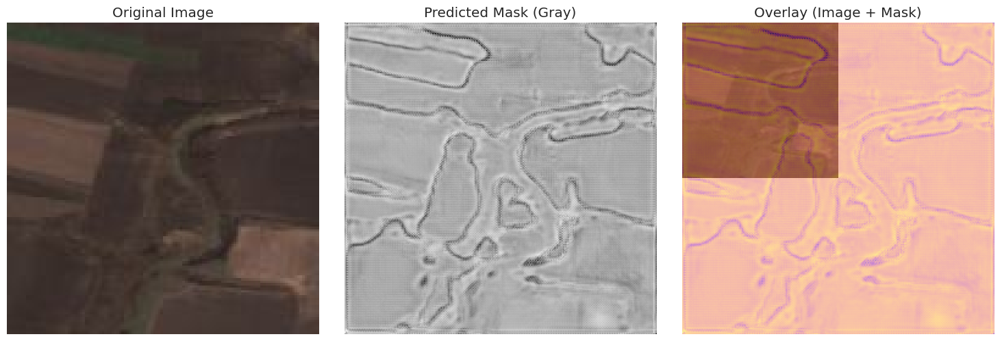

'Lighter regions (closer to white) → Higher predicted probability of erosion.\n\nDarker regions (closer to black) → Lower predicted probability (i.e. non-eroded areas).\n\nGray textures or midtones → Uncertain regions or transitions.'

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class SoilErosionDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_paths = sorted([os.path.join(img_dir, f) for f in os.listdir(img_dir) if f.endswith(".jpg")])
        self.mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith(".png")])
        self.transform = transform

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        image = np.array(Image.open(self.img_paths[idx]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[idx]).convert("L"))
        mask = (mask > 0).astype(np.float32)

        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"].unsqueeze(0)  # Shape: (1, H, W)

        return image, mask


class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )

        self.down1 = conv_block(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)

        self.bottom = conv_block(256, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.conv3 = conv_block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = conv_block(128, 64)

        self.final = nn.Conv2d(64, 1, kernel_size=1)

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)
        d2 = self.down2(p1)
        p2 = self.pool2(d2)
        d3 = self.down3(p2)
        p3 = self.pool3(d3)

        b = self.bottom(p3)

        u3 = self.up3(b)
        u3 = torch.cat([u3, d3], dim=1)
        u3 = self.conv3(u3)

        u2 = self.up2(u3)
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.conv2(u2)

        u1 = self.up1(u2)
        u1 = torch.cat([u1, d1], dim=1)
        u1 = self.conv1(u1)

        return self.final(u1)

#
transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(),
    ToTensorV2()
])

train_dataset = SoilErosionDataset(
    img_dir="/content/extracted/processed_data/train",
    mask_dir="/content/extracted/processed_data/masks",
    transform=transform
)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

model = UNet().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)

        outputs = model(images)
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()



torch.save(model.state_dict(), "unet_weights_final.pth")


def normalize_mask(mask):
    return (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)

def show_prediction(image, mask):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(normalize_mask(mask), cmap='gray')
    plt.title("Predicted Mask (Gray)")
    plt.axis('off')

    # Overlay mask with colormap
    plt.subplot(1, 3, 3)
    plt.imshow(image)
    plt.imshow(normalize_mask(mask), cmap='plasma', alpha=0.5)  # Colored overlay
    plt.title("Overlay (Image + Mask)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def predict_image_from_local(model, image_path, transform, device):
    model.eval()
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)
    transformed = transform(image=img_np)
    tensor_img = transformed['image'].unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(tensor_img)
        pred = torch.sigmoid(output).squeeze().cpu().numpy()

    return img_np, pred


if __name__ == "__main__":
    image_path = "1020.jpg"
    model = UNet().to(device)
    model.load_state_dict(torch.load("unet_weights_final.pth", map_location=device))

    image, pred_mask = predict_image_from_local(model, image_path, transform, device)
    show_prediction(image, pred_mask)


'''Lighter regions (closer to white) → Higher predicted probability of erosion.

Darker regions (closer to black) → Lower predicted probability (i.e. non-eroded areas).

Gray textures or midtones → Uncertain regions or transitions.'''


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class SoilErosionDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_paths = sorted([os.path.join(img_dir, f) for f in os.listdir(img_dir) if f.endswith(".jpg")])
        self.mask_paths = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith(".png")])
        self.transform = transform

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        image = np.array(Image.open(self.img_paths[idx]).convert("RGB"))
        mask = np.array(Image.open(self.mask_paths[idx]).convert("L"))
        mask = (mask > 0).astype(np.float32)

        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"].unsqueeze(0)

        return image, mask

class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )
        self.down1 = conv_block(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.bottom = conv_block(256, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.conv3 = conv_block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = conv_block(128, 64)
        self.final = nn.Conv2d(64, 1, kernel_size=1)
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)
        d2 = self.down2(p1)
        p2 = self.pool2(d2)
        d3 = self.down3(p2)
        p3 = self.pool3(d3)
        b = self.bottom(p3)
        u3 = self.up3(b)
        u3 = torch.cat([u3, d3], dim=1)
        u3 = self.conv3(u3)
        u2 = self.up2(u3)
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.conv2(u2)
        u1 = self.up1(u2)
        u1 = torch.cat([u1, d1], dim=1)
        u1 = self.conv1(u1)
        return self.final(u1)

transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(),
    ToTensorV2()
])

train_dataset = SoilErosionDataset(
    img_dir="/content/extracted/processed_data/train",
    mask_dir="/content/extracted/processed_data/masks",
    transform=transform
)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

model = UNet().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

writer = SummaryWriter("runs/soil_erosion_experiment_1")
sample_img, _ = next(iter(train_loader))
writer.add_graph(model, sample_img.to(device))

num_epochs = 15
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        loss = criterion(outputs, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)

    writer.add_scalar("Loss/train", epoch_loss, epoch)

    if (epoch + 1) % 5 == 0:
        model.eval()
        images, masks = next(iter(train_loader))
        images, masks = images.to(device), masks.to(device)
        with torch.no_grad():
            outputs = torch.sigmoid(model(images))
        img = images[0].cpu()
        mask = masks[0].cpu()
        pred = outputs[0].cpu()
        pred_norm = (pred - pred.min()) / (pred.max() - pred.min() + 1e-8)
        writer.add_image("Input Image", img, epoch)
        writer.add_image("Ground Truth Mask", mask, epoch)
        writer.add_image("Predicted Mask", pred_norm, epoch)

writer.close()
torch.save(model.state_dict(), "unet_weights_final.pth")


In [ ]:
!pip install streamlit albumentations opencv-python pillow

In [ ]:
!pip install torchviz


import torch
from torchviz import make_dot

# Create a sample input tensor
sample_input = torch.randn((1, 3, 256, 256)).to(device)

# Pass it through your model
model = UNet().to(device)
output = model(sample_input)

# Generate and display model graph
make_dot(output, params=dict(list(model.named_parameters()))).render("unet_model_architecture", format="png")


In [ ]:
from IPython.display import Image
Image(filename="unet_model_architecture.png")


In [ ]:
%reload_ext tensorboard


In [ ]:
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

In [ ]:
%%writefile app.py
import streamlit as st
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
from torchvision.transforms.functional import to_tensor, to_pil_image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import os


class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        def conv_block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True)
            )
        self.down1 = conv_block(3, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = conv_block(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = conv_block(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.bottom = conv_block(256, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.conv3 = conv_block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv2 = conv_block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = conv_block(128, 64)
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)
        d2 = self.down2(p1)
        p2 = self.pool2(d2)
        d3 = self.down3(p2)
        p3 = self.pool3(d3)
        b = self.bottom(p3)
        u3 = self.up3(b)
        u3 = torch.cat([u3, d3], dim=1)
        u3 = self.conv3(u3)
        u2 = self.up2(u3)
        u2 = torch.cat([u2, d2], dim=1)
        u2 = self.conv2(u2)
        u1 = self.up1(u2)
        u1 = torch.cat([u1, d1], dim=1)
        u1 = self.conv1(u1)
        return self.final(u1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)


if os.path.exists("unet_weights_final.pth"):
    model.load_state_dict(torch.load("unet_weights_final.pth", map_location=device))
    model.eval()
else:
    st.error("Model weights file not found. Please upload 'unet_weights_final.pth'.")


def segment_image(image: Image.Image):
    transform = A.Compose([
        A.Resize(256, 256),
        A.Normalize(),
        ToTensorV2()
    ])
    image_np = np.array(image.convert("RGB"))
    transformed = transform(image=image_np)
    input_tensor = transformed["image"].unsqueeze(0).to(device)

    with torch.no_grad():
        output = torch.sigmoid(model(input_tensor)).squeeze().cpu().numpy()

    binary_mask = (output > 0.5).astype(np.uint8) * 255
    return to_pil_image(transformed["image"]), Image.fromarray(binary_mask)


st.set_page_config(page_title="Soil Erosion Segmentation", layout="centered")
st.title("🛰️ Soil Erosion Segmentation with U-Net")
st.write("Upload a satellite image to see the segmented soil erosion area.")

uploaded = st.file_uploader("Upload an image", type=["jpg", "jpeg", "png"])

if uploaded:
    pil_image = Image.open(uploaded)
    input_tensor_img, mask_img = segment_image(pil_image)

    st.subheader("Input Image")
    st.image(uploaded)

    st.subheader("Predicted Mask")
    st.image(input_tensor_img)




Writing app.py


In [ ]:
!pip install streamlit pyngrok


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 96.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 131.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 8.5 MB/s eta 0:00:00


In [ ]:
!ngrok config add-authtoken 2zK7CQkO3BDrO8Go8GlLYo610aU_mM74hR2NhKNpFdw8c6Mq

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [ ]:
from pyngrok import ngrok
!pkill streamlit

public_url = ngrok.connect(8501)
print("🔗 Streamlit URL:", public_url)

!streamlit run app.py &


🔗 Streamlit URL: NgrokTunnel: "https://bfea-34-16-194-74.ngrok-free.app" -> "http://localhost:8501"



  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.16.194.74:8501

